Task 02 - Spatio Temporal Analysis

In [131]:
# Installing the required libraries
%pip install matplotlib
%pip install numpy
%pip install pandas
%pip install seaborn

Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.
Note: you may need to restart the kernel to use updated packages.


In [132]:
# Importing the relevant libraries
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

RESET = "\033[0m"
RED = "\033[91m"
GREEN = "\033[92m"
BLUE = "\033[94m"

In [133]:
combined_dependant_df = pd.read_csv("Datasets/dependant_variables.csv", parse_dates=["Date"])
combined_independant_df = pd.read_csv("Datasets/independant_variables.csv", parse_dates=["Date"])

In [134]:
combined_dependant_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11494 entries, 0 to 11493
Data columns (total 3 columns):
 #   Column        Non-Null Count  Dtype         
---  ------        --------------  -----         
 0   HCHO_reading  11494 non-null  float64       
 1   Location      11494 non-null  object        
 2   Date          11494 non-null  datetime64[ns]
dtypes: datetime64[ns](1), float64(1), object(1)
memory usage: 269.5+ KB


In [135]:
combined_independant_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12782 entries, 0 to 12781
Data columns (total 6 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           12782 non-null  datetime64[ns]
 1   Location       12782 non-null  object        
 2   Precipitation  9339 non-null   float64       
 3   Temperature    12122 non-null  float64       
 4   Wind Speed     9971 non-null   float64       
 5   Elevation      12782 non-null  float64       
dtypes: datetime64[ns](1), float64(4), object(1)
memory usage: 599.3+ KB


In [136]:
# Combining the independant and dependant dataframes
combined_df = pd.merge(combined_independant_df, combined_dependant_df[['Location', 'Date', 'HCHO_reading']], on=['Location', 'Date'])

In [137]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11494 entries, 0 to 11493
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           11494 non-null  datetime64[ns]
 1   Location       11494 non-null  object        
 2   Precipitation  8466 non-null   float64       
 3   Temperature    10889 non-null  float64       
 4   Wind Speed     8942 non-null   float64       
 5   Elevation      11494 non-null  float64       
 6   HCHO_reading   11494 non-null  float64       
dtypes: datetime64[ns](1), float64(5), object(1)
memory usage: 628.7+ KB


In [138]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11494 entries, 0 to 11493
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           11494 non-null  datetime64[ns]
 1   Location       11494 non-null  object        
 2   Precipitation  8466 non-null   float64       
 3   Temperature    10889 non-null  float64       
 4   Wind Speed     8942 non-null   float64       
 5   Elevation      11494 non-null  float64       
 6   HCHO_reading   11494 non-null  float64       
dtypes: datetime64[ns](1), float64(5), object(1)
memory usage: 628.7+ KB


In [139]:
# Creating dataframes for each district from the unique values of the list
colombo_df = pd.DataFrame()
matara_df = pd.DataFrame()
nuwaraeliya_df = pd.DataFrame()
monaragala_df = pd.DataFrame()
kurunegala_df = pd.DataFrame()
jaffna_df = pd.DataFrame()
kandy_df = pd.DataFrame()

In [140]:
# Separating the combined dataframe into separate ones for each district
for index, row in combined_df.iterrows():
    location = row["Location"]
    if location == "Colombo Proper":
        colombo_df = pd.concat([colombo_df, pd.DataFrame([row])], ignore_index=True)
    elif location == "Deniyaya, Matara":
        matara_df = pd.concat([matara_df, pd.DataFrame([row])], ignore_index=True)
    elif location == "Nuwara Eliya Proper":
        nuwaraeliya_df = pd.concat([nuwaraeliya_df, pd.DataFrame([row])], ignore_index=True)
    elif location == "Bibile, Monaragala":
        monaragala_df = pd.concat([monaragala_df, pd.DataFrame([row])], ignore_index=True)
    elif location == "Kurunegala Proper":
        kurunegala_df = pd.concat([kurunegala_df, pd.DataFrame([row])], ignore_index=True)
    elif location == "Jaffna Proper":
        jaffna_df = pd.concat([jaffna_df, pd.DataFrame([row])], ignore_index=True)
    elif location == "Kandy Proper":
        kandy_df = pd.concat([kandy_df, pd.DataFrame([row])], ignore_index=True)

In [141]:
df_list = [ colombo_df, matara_df,nuwaraeliya_df,monaragala_df,kurunegala_df,jaffna_df,kandy_df]

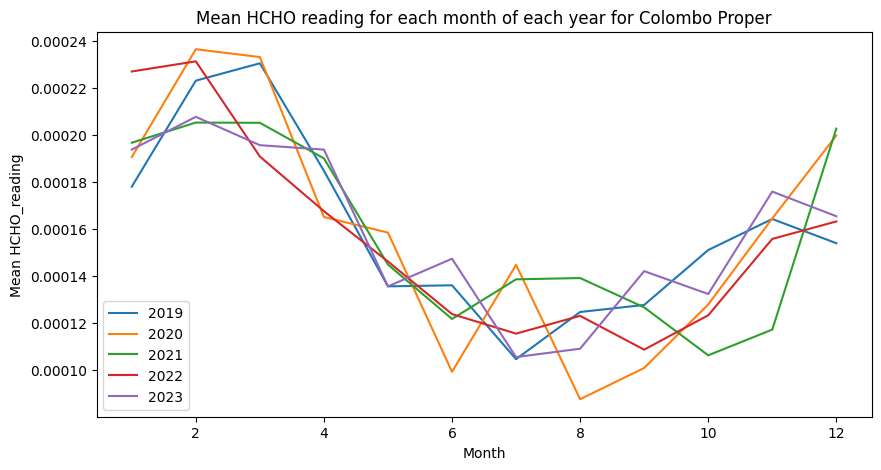

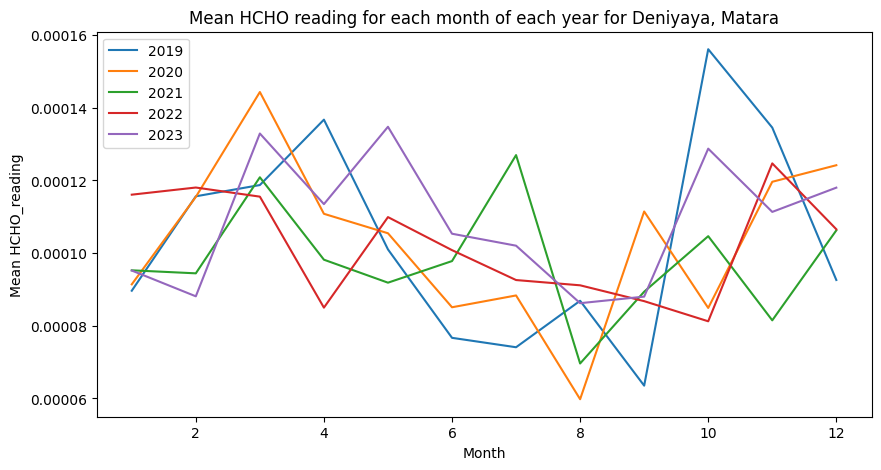

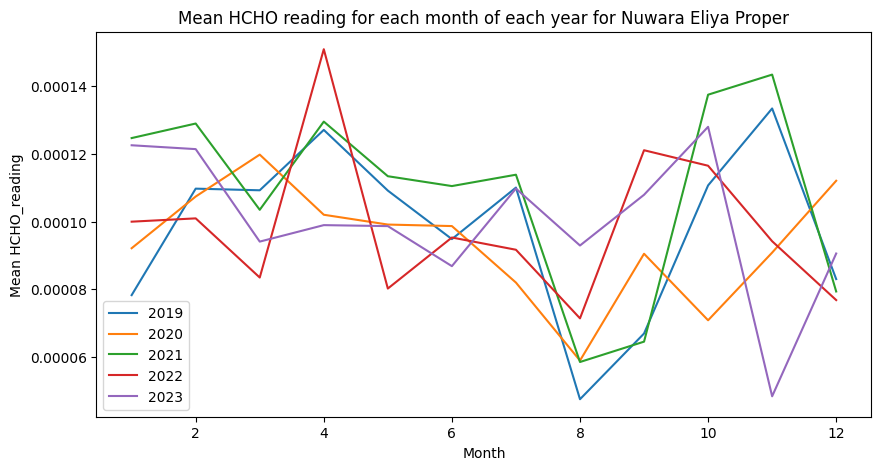

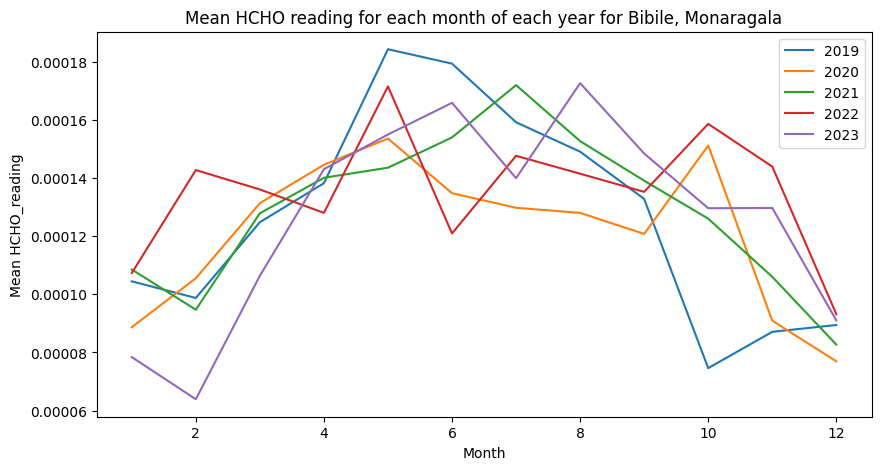

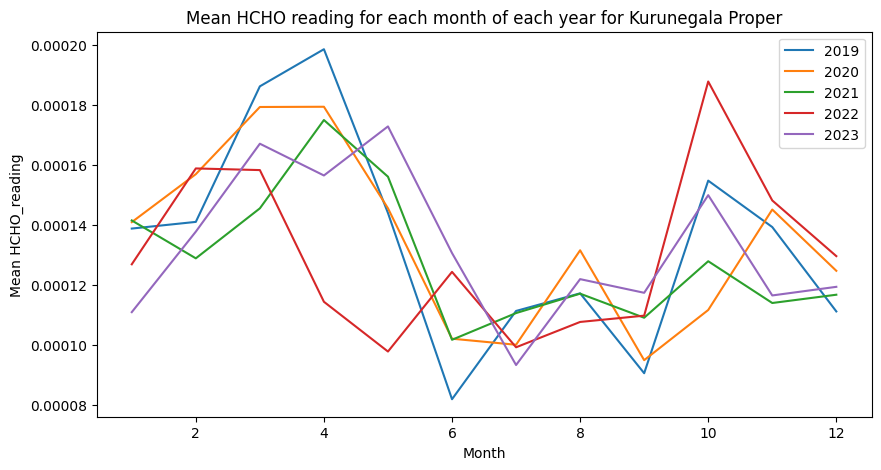

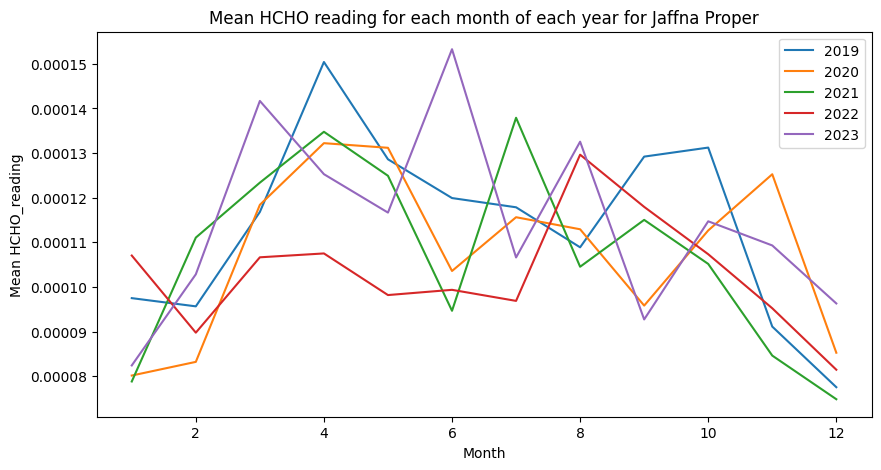

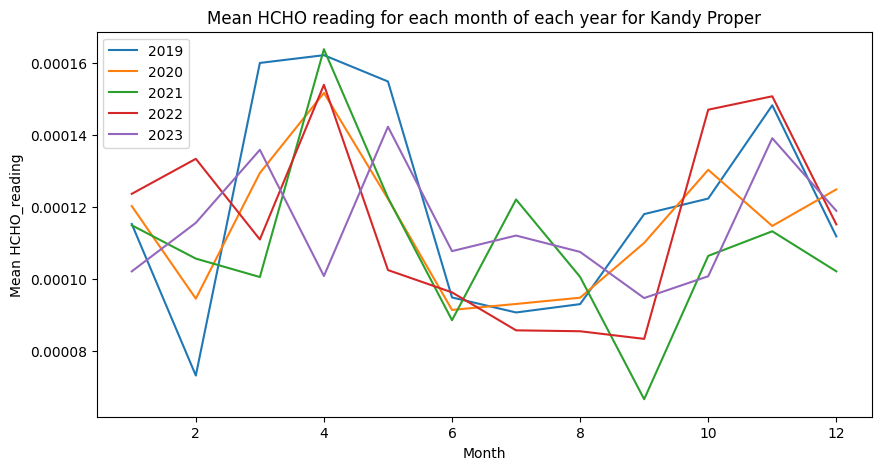

In [142]:
# Creating a plot to show the mean monthly HCHO reading for each year in a certain district.
for dataframe in df_list:
    # Creating a new plot for each dataframe
    plt.figure(figsize=(10,5))

    # Looping through each dataframe and calculating the mean monthly HCHO reading for each year
    for year in range(2019, 2024):
        filtered_df = dataframe[(dataframe["Date"].dt.year == year)]
        mean_hcho = filtered_df.groupby(filtered_df["Date"].dt.month)["HCHO_reading"].mean()
        plt.plot(mean_hcho.index, mean_hcho.values, label=str(year))

    # Drawing the plot
    title = "Mean HCHO reading for each month of each year for " +  str(dataframe.iloc[0, 1])
    plt.title(title)
    plt.xlabel("Month")
    plt.ylabel("Mean HCHO_reading")
    plt.legend()

    plt.show()

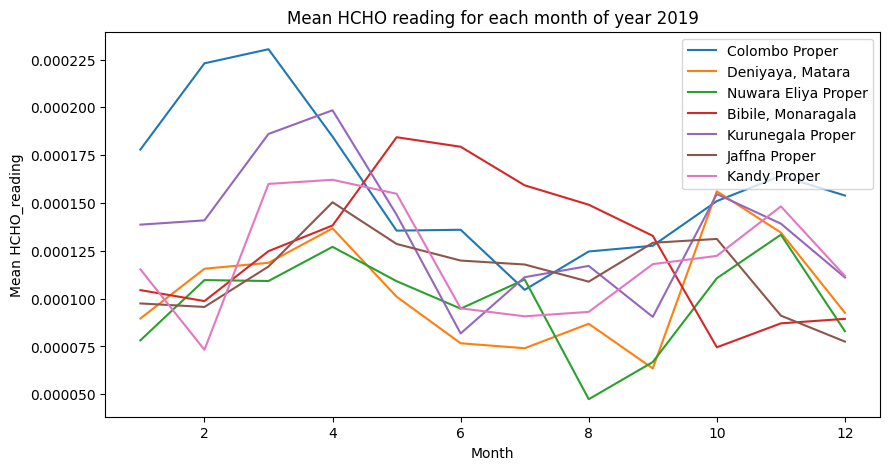

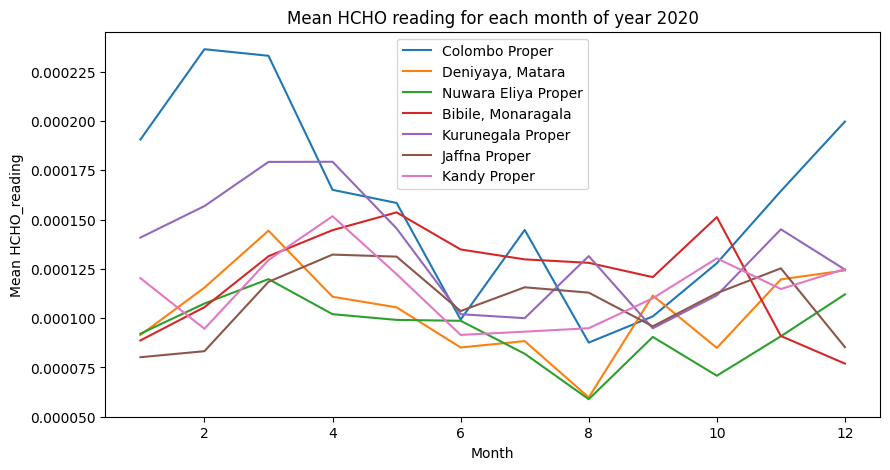

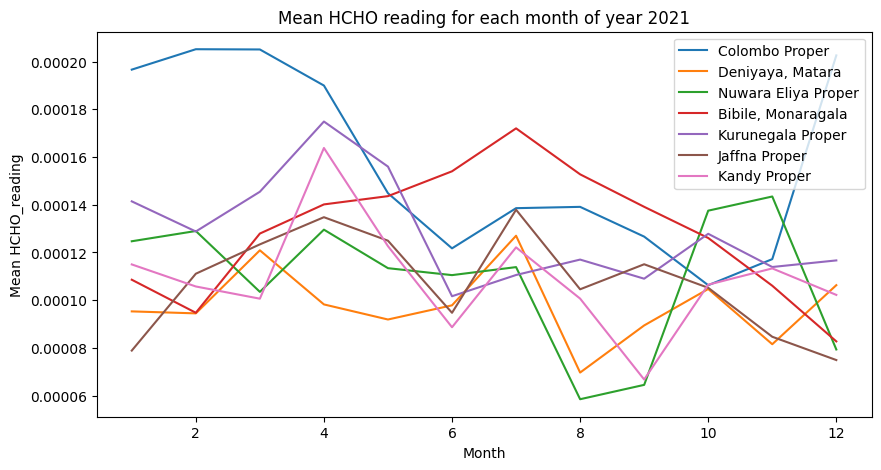

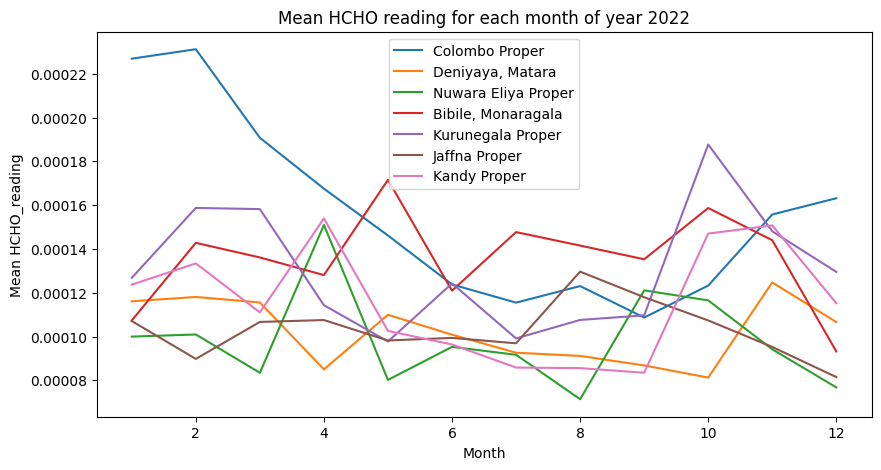

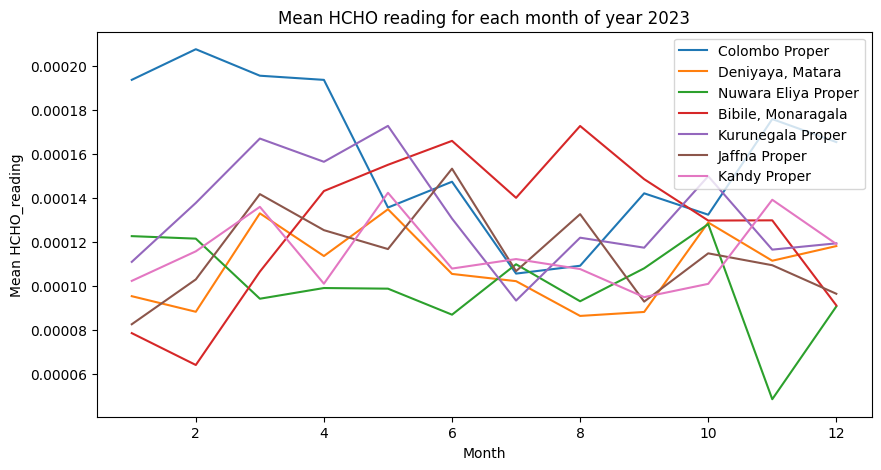

In [143]:
# Creating a plot to show the mean monthly HCHO reading for each district in a year.
for year in range(2019, 2024):
    plt.figure(figsize=(10,5))

    # Looping through each dataframe and calculating the mean monthly HCHO reading
    for i, dataframe in enumerate(df_list):
        filtered_df = dataframe[(dataframe["Date"].dt.year == year)]
        mean_hcho = filtered_df.groupby(filtered_df["Date"].dt.month)["HCHO_reading"].mean()
        plt.plot(mean_hcho.index, mean_hcho.values, label=dataframe.iloc[0, 1])

    # Drawing the plot
    title = "Mean HCHO reading for each month of year " + str(year)
    plt.title(title)
    plt.xlabel("Month")
    plt.ylabel("Mean HCHO_reading")
    plt.legend()

    plt.show()

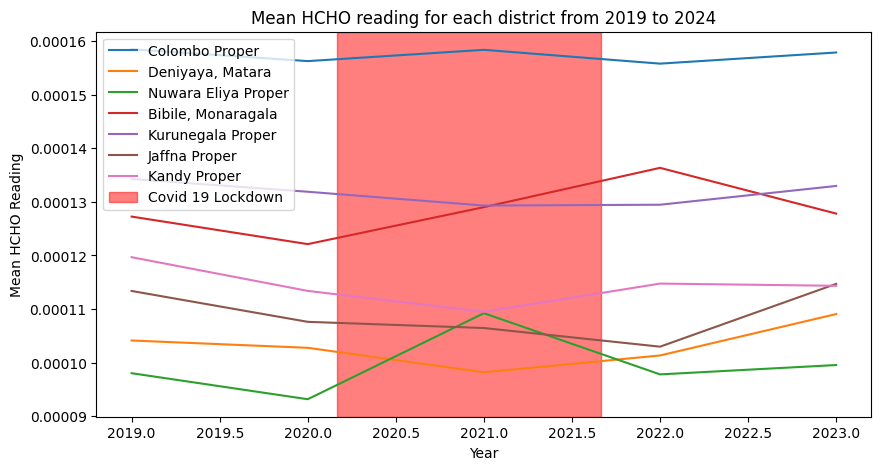

In [144]:

# Looping through each DataFrame and plotting the mean annual HCHO
plt.figure(figsize=(10, 5))
for dataframe in df_list:
    mean_hcho = dataframe.groupby(dataframe["Date"].dt.year)["HCHO_reading"].mean()
    plt.plot(mean_hcho.index, mean_hcho.values, label=str(dataframe.iloc[0, 1]))

start_highlight = 2020 + (3 - 1) / 12  # March 2020
end_highlight = 2021 + (9 - 1) / 12    # September 2021
plt.axvspan(start_highlight, end_highlight, color='red', alpha=0.5, label='Covid 19 Lockdown')

# Drawing the graph
plt.title("Mean HCHO reading for each district from 2019 to 2024")
plt.xlabel("Year")
plt.ylabel("Mean HCHO Reading")
plt.legend()
plt.show()

In [145]:
# Preprocessing the independant variables

In [146]:
# Getting the information about the variables
for dataframe in df_list:
    print(BLUE, dataframe.iloc[0, 1], RESET)
    dataframe.info()
    print("")

 Colombo Proper 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1642 entries, 0 to 1641
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           1642 non-null   datetime64[ns]
 1   Location       1642 non-null   object        
 2   Precipitation  1450 non-null   float64       
 3   Temperature    1641 non-null   float64       
 4   Wind Speed     1465 non-null   float64       
 5   Elevation      1642 non-null   float64       
 6   HCHO_reading   1642 non-null   float64       
dtypes: datetime64[ns](1), float64(5), object(1)
memory usage: 89.9+ KB

 Deniyaya, Matara 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1642 entries, 0 to 1641
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           1642 non-null   datetime64[ns]
 1   Location       1642 non-null   object        
 2   Precipitati

In [147]:
# Using median imputation to fill in the missing variables since its time series data
for dataframe in df_list:
    for column in dataframe.columns:
        if dataframe[column].dtype in ['float64', 'int64']:
            median = dataframe[column].median()
            dataframe[column] = dataframe[column].fillna(median)

/Users/vinodwijetilleke/.pyenv/versions/3.12.0/lib/python3.12/site-packages/numpy/lib/nanfunctions.py:1215: RuntimeWarning: Mean of empty slice
  return np.nanmean(a, axis, out=out, keepdims=keepdims)


In [148]:
# Rechecking for missing values
for dataframe in df_list:
    print(BLUE, dataframe.iloc[0, 1], RESET)
    dataframe.info()
    print("")

 Colombo Proper 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1642 entries, 0 to 1641
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           1642 non-null   datetime64[ns]
 1   Location       1642 non-null   object        
 2   Precipitation  1642 non-null   float64       
 3   Temperature    1642 non-null   float64       
 4   Wind Speed     1642 non-null   float64       
 5   Elevation      1642 non-null   float64       
 6   HCHO_reading   1642 non-null   float64       
dtypes: datetime64[ns](1), float64(5), object(1)
memory usage: 89.9+ KB

 Deniyaya, Matara 
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1642 entries, 0 to 1641
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           1642 non-null   datetime64[ns]
 1   Location       1642 non-null   object        
 2   Precipitati

In [149]:
# Rechecking the data that is still missing
for dataframe in df_list:
    missing_rows = dataframe[dataframe.isnull().any(axis=1)]
    if missing_rows.size > 0:
        print(RED, dataframe.iloc[0, 1], RESET)
        print(missing_rows)
        print("")
    else:
        print(GREEN, dataframe.iloc[0, 1], "has no missing values", RESET )
        
# Wind speed data for Nuwara Eliya could not be collected and therefore couldnt be calculated or imputed.

 Colombo Proper has no missing values 
 Deniyaya, Matara has no missing values 
 Nuwara Eliya Proper 
           Date             Location  Precipitation  Temperature  Wind Speed  \
0    2019-01-01  Nuwara Eliya Proper            4.6         16.2         NaN   
1    2019-01-02  Nuwara Eliya Proper            4.6         15.0         NaN   
2    2019-01-03  Nuwara Eliya Proper            4.6         15.1         NaN   
3    2019-01-04  Nuwara Eliya Proper            4.6         15.1         NaN   
4    2019-01-05  Nuwara Eliya Proper            4.6         12.6         NaN   
...         ...                  ...            ...          ...         ...   
1637 2023-12-18  Nuwara Eliya Proper            1.3         16.8         NaN   
1638 2023-12-19  Nuwara Eliya Proper           45.7         16.0         NaN   
1639 2023-12-20  Nuwara Eliya Proper           12.2         15.6         NaN   
1640 2023-12-21  Nuwara Eliya Proper            3.6         15.8         NaN   
1641 2023-12-22  N

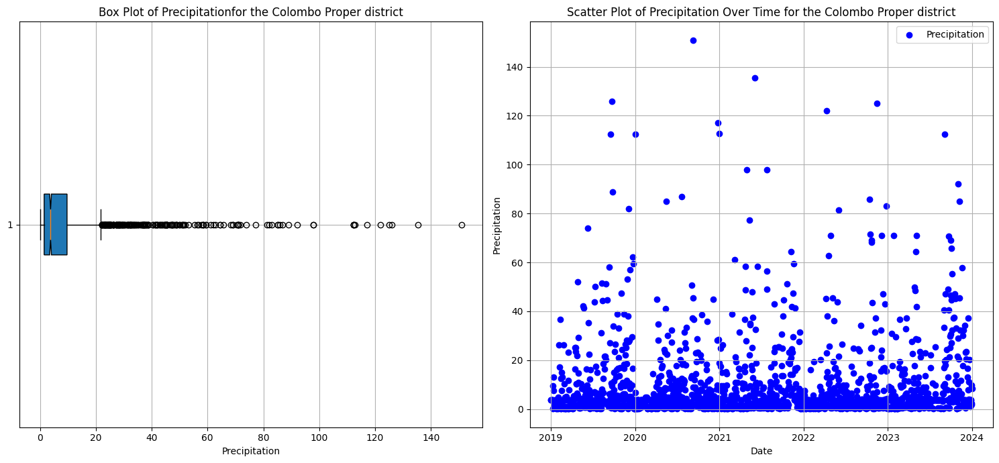

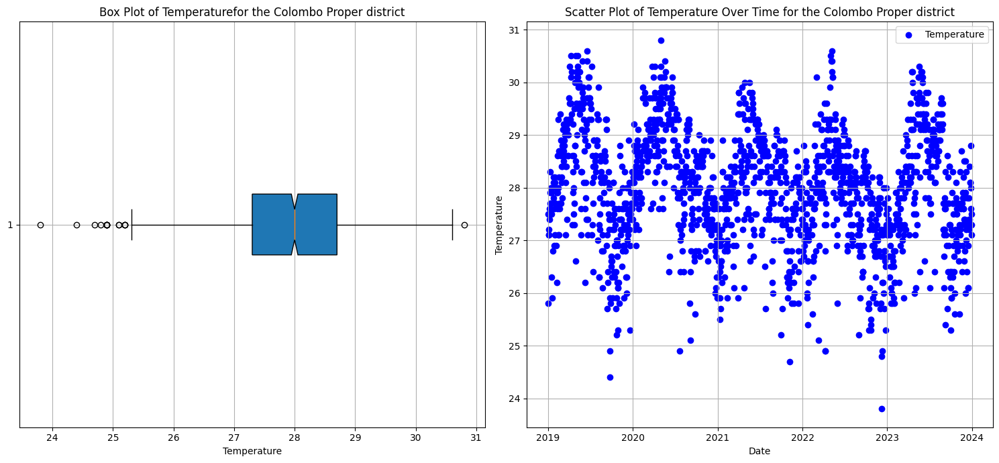

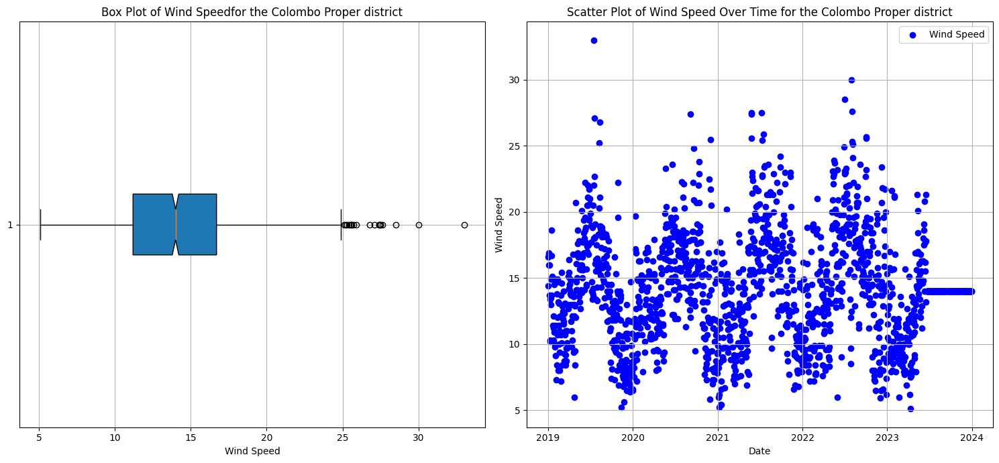

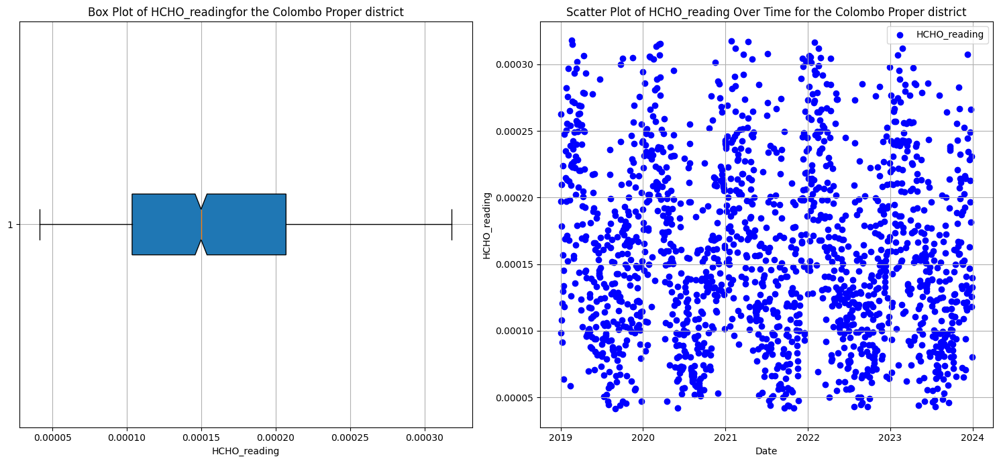

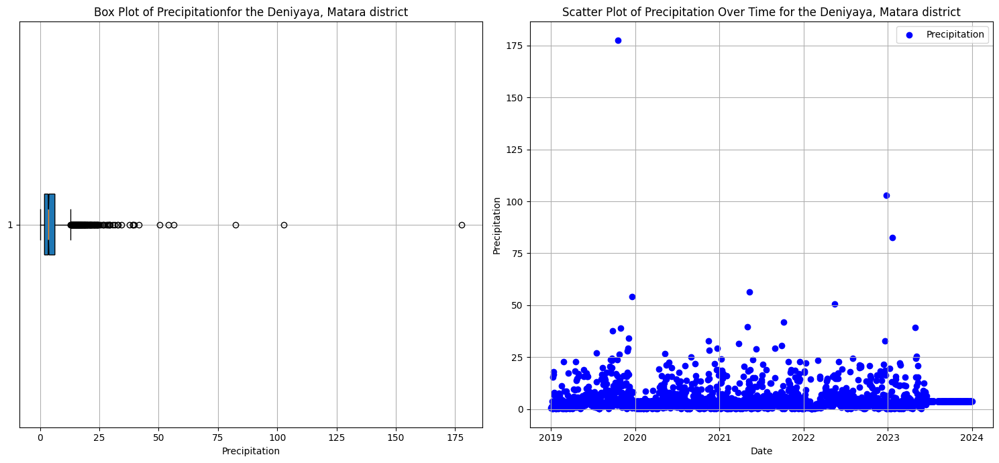

...

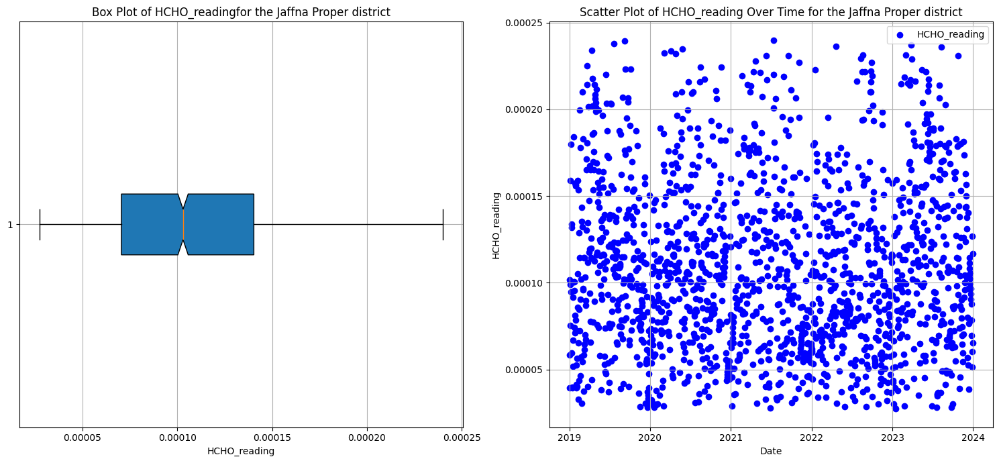

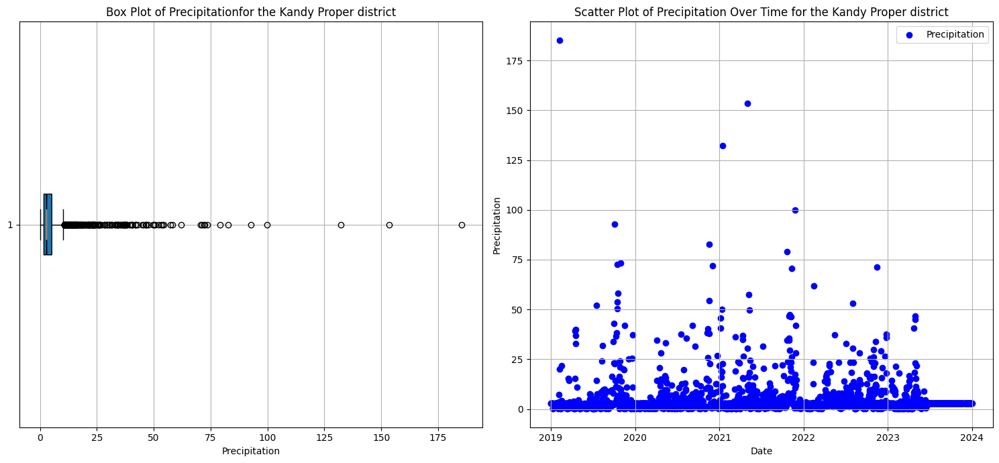

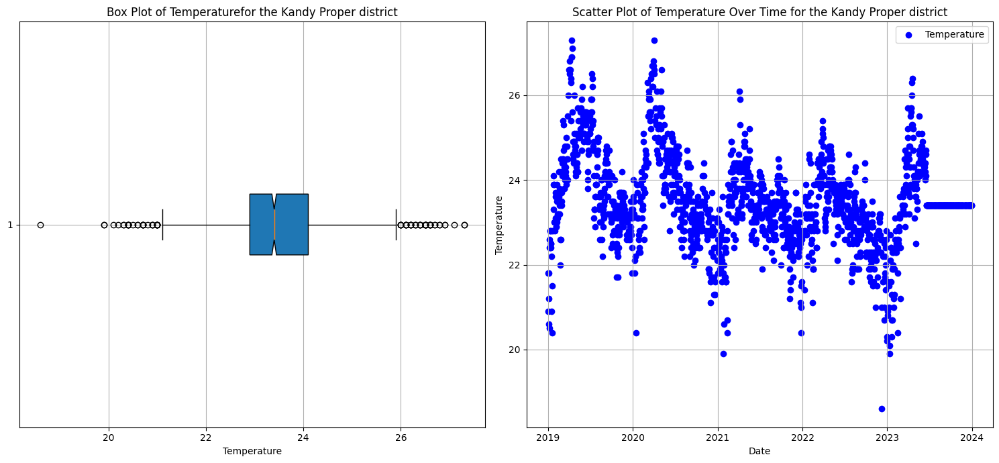

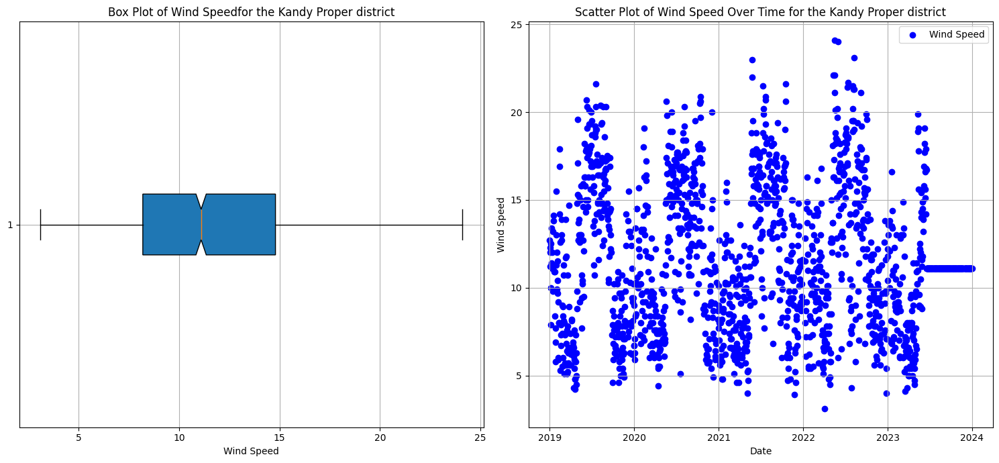

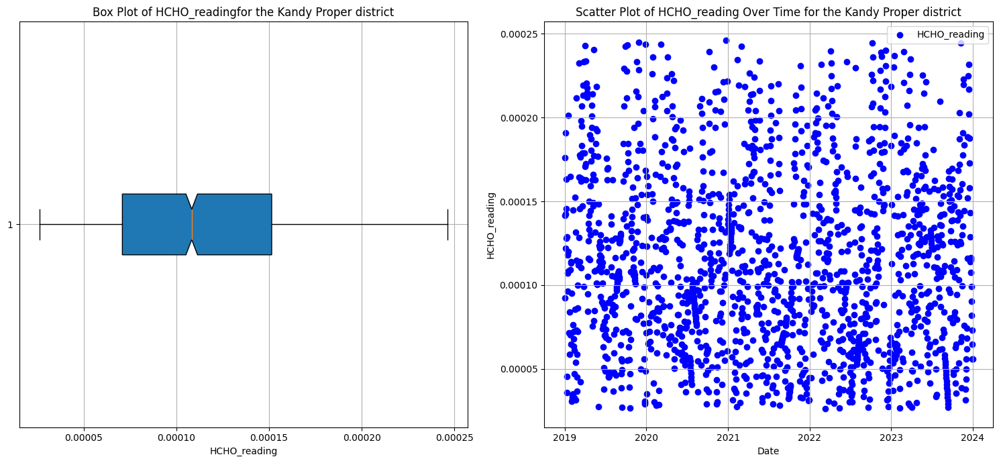

In [150]:
# Iterate through each dataframe in your list
for dataframe in df_list:
    # Iterate through each column in the dataframe
    for column in dataframe.columns:
        # Check if the column is of type float64 and not named 'Elevation'
        if dataframe[column].dtype == 'float64' and column != 'Elevation':
            plt.figure(figsize=(15, 7))

            # Box plot
            plt.subplot(121) 
            plt.boxplot(dataframe[column], vert=False, patch_artist=True, showfliers=True, notch=True)
            title = "Box Plot of " + column + "for the " + dataframe.iloc[0, 1] + " district"
            plt.title(title)
            plt.xlabel(column)
            plt.grid(True)

            # Scatter plot
            plt.subplot(122)
            plt.scatter(dataframe["Date"], dataframe[column], color="blue", label=column)
            title = "Scatter Plot of " + column + " Over Time for the " + dataframe.iloc[0, 1] + " district"
            plt.title(title)
            plt.xlabel("Date")
            plt.ylabel(column)
            plt.legend()
            plt.grid(True)

            plt.tight_layout()
            plt.show()

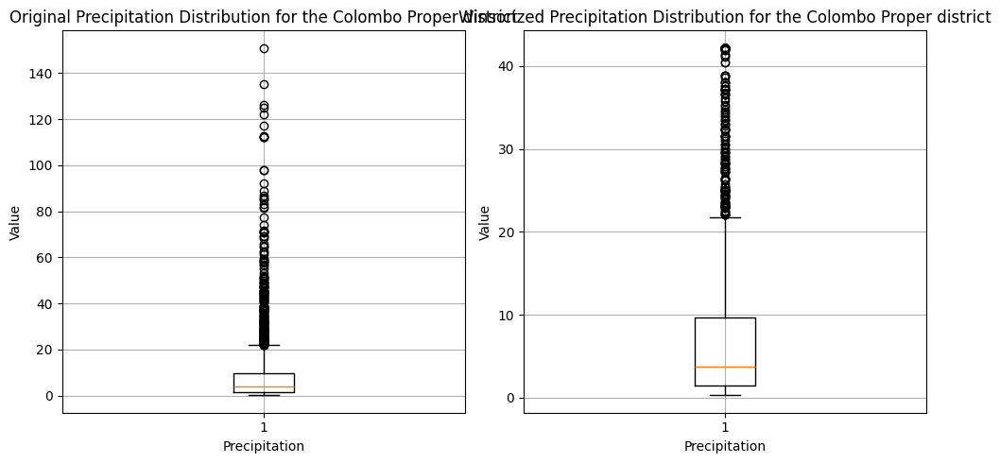

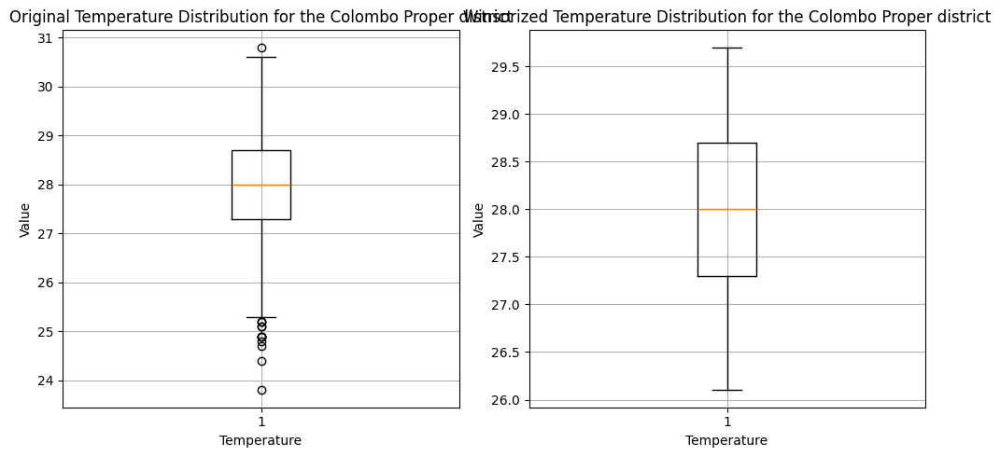

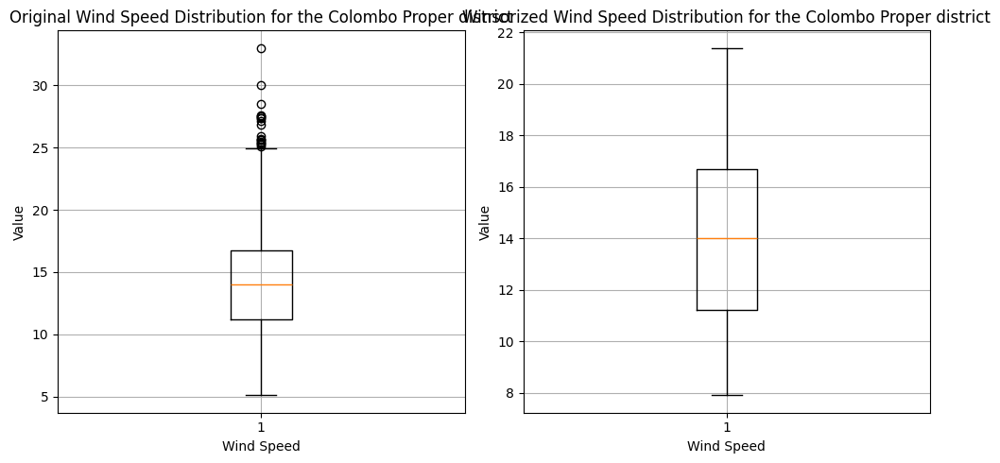

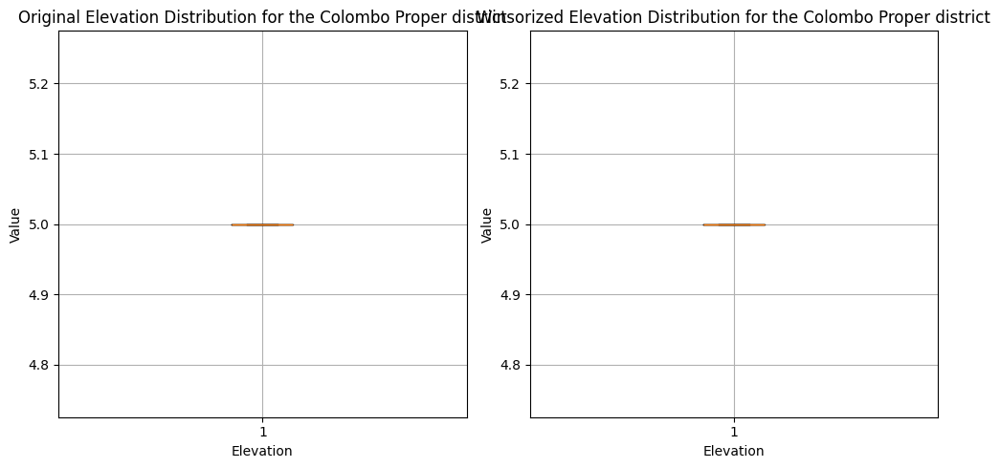

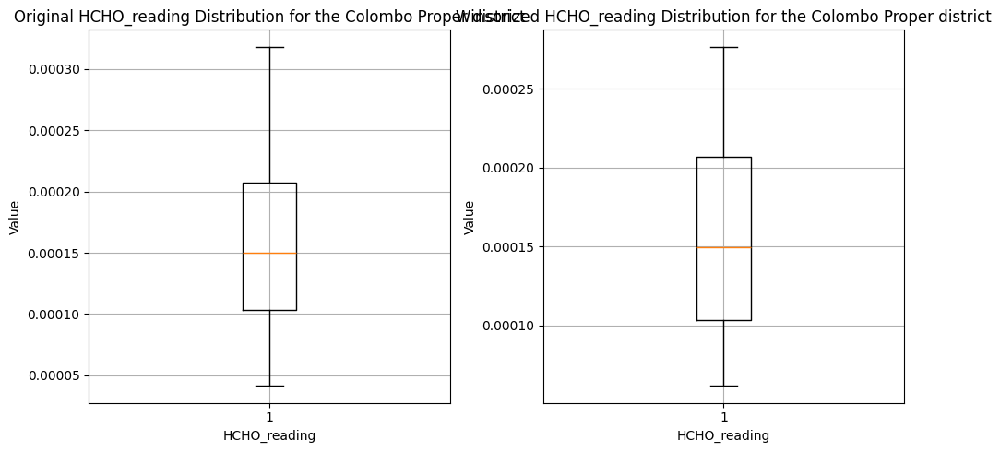

...

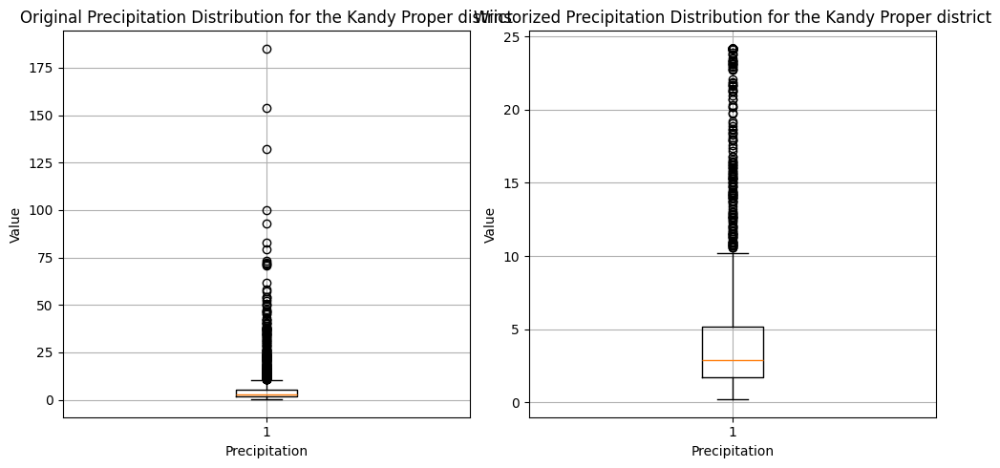

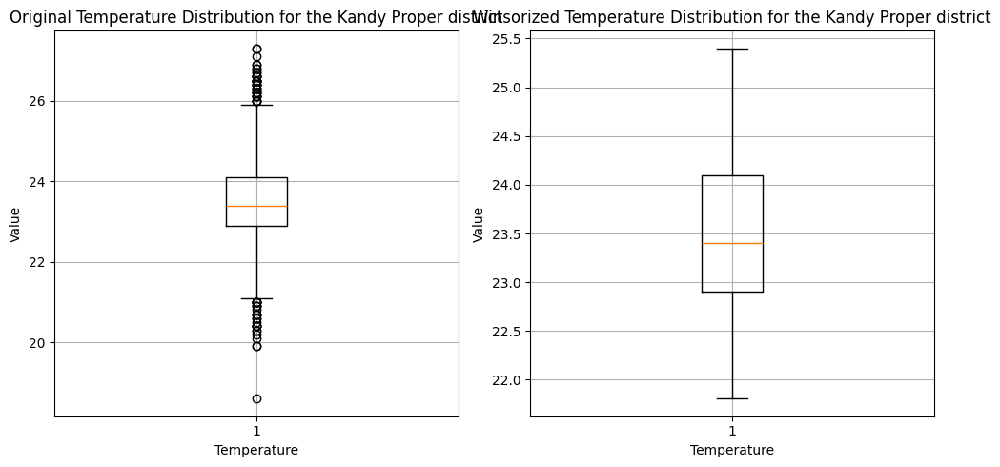

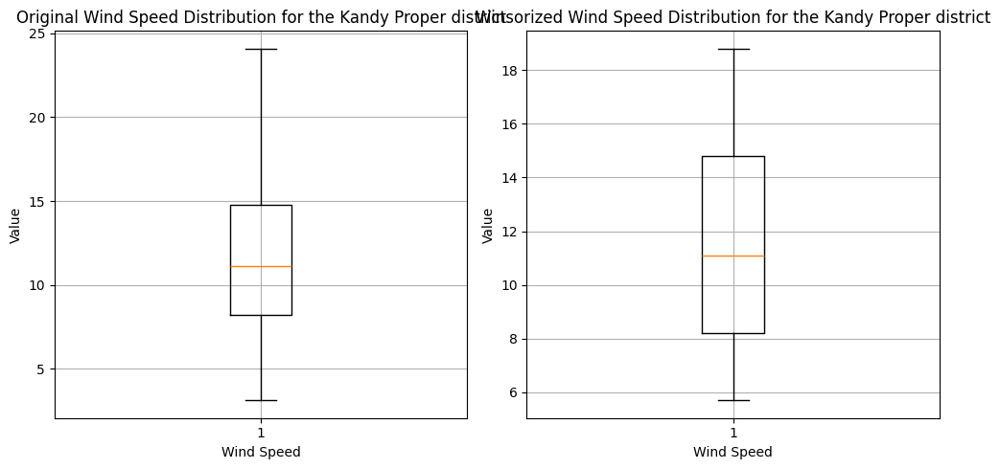

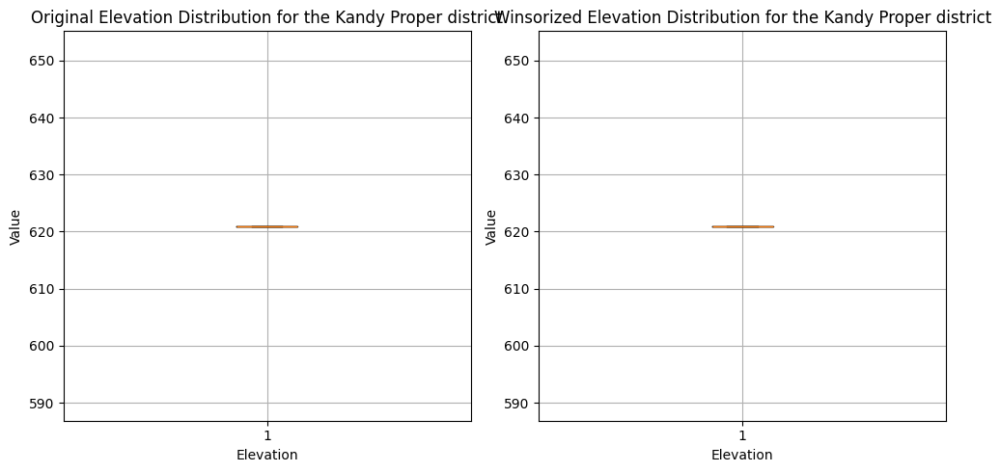

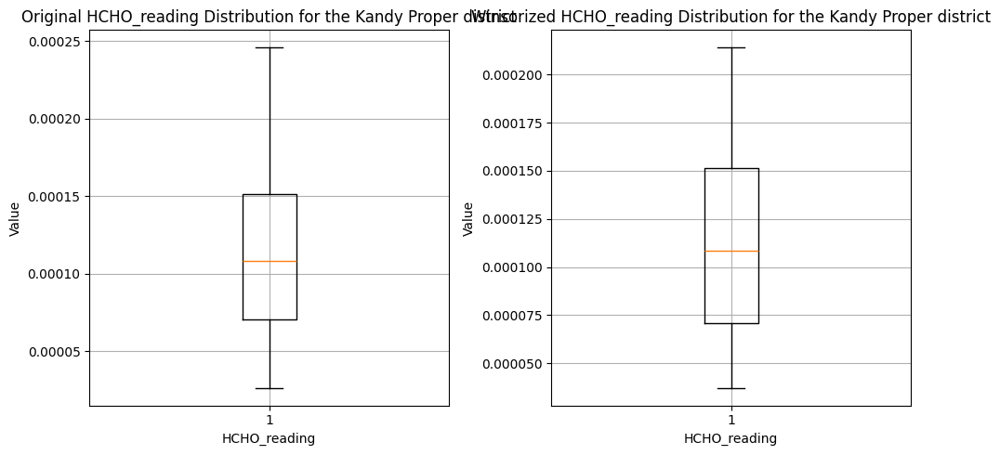

In [151]:
# Loop through each dataframe in the list
for dataframe in df_list:
    # Loop through each column in the dataframe
    for column in dataframe.columns:
        if dataframe[column].dtype == 'float64':  
            # Calculate the 5th and 95th percentiles
            percentiles = dataframe[column].quantile([0.05, 0.95])
            lower_threshold = percentiles.loc[0.05]
            upper_threshold = percentiles.loc[0.95]

            # Make a copy of the original column for plotting
            original_data = dataframe[column].copy()

            # Perform winsorization on the column and update it directly in the dataframe
            dataframe[column] = np.clip(dataframe[column], lower_threshold, upper_threshold)

            # Plotting the original and winsorized distributions
            plt.figure(figsize=(10, 5))

            plt.subplot(121)
            plt.boxplot(original_data, showfliers=True)
            plt.xlabel(column)
            plt.ylabel("Value")
            plt.title(f"Original {column} Distribution for the {dataframe.iloc[0, 1]} district")
            plt.grid(True)

            plt.subplot(122)
            plt.boxplot(dataframe[column], showfliers=True)
            plt.xlabel(column)
            plt.ylabel("Value")
            plt.title(f"Winsorized {column} Distribution for the {dataframe.iloc[0, 1]} district")
            plt.grid(True)

            plt.tight_layout()
            plt.show()


In [152]:
import pandas as pd

lower_percentile = 0.05
upper_percentile = 0.95

# Iterate over each dataframe in the list
for i in range(len(df_list)):
    # Retrieve the dataframe
    df = df_list[i]

    mask = pd.Series(True, index=df.index)

    # Identify if the current dataframe is the special case for "Nuwara Eliya Proper"
    is_nuwara_eliya_proper = (df.iloc[0, 1] == "Nuwara Eliya Proper") if df.shape[0] > 0 and df.shape[1] > 1 else False

    # Iterate over each column in the dataframe
    for column in df.columns:
        # Check if the column is of type float64 and not "Wind Speed" in the special case
        if df[column].dtype == 'float64' and not (is_nuwara_eliya_proper and column == "Wind Speed"):
            # Calculate the IQR thresholds
            lower_threshold = df[column].quantile(lower_percentile)
            upper_threshold = df[column].quantile(upper_percentile)

            # Update the mask to consider the current column's thresholds
            mask &= (df[column] >= lower_threshold) & (df[column] <= upper_threshold)

    # Apply the combined mask to the dataframe
    df_list[i] = df[mask]


In [153]:
for dataframe in df_list:
    dataframe.info()

<class 'pandas.core.frame.DataFrame'>
Index: 1401 entries, 0 to 1641
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           1401 non-null   datetime64[ns]
 1   Location       1401 non-null   object        
 2   Precipitation  1401 non-null   float64       
 3   Temperature    1401 non-null   float64       
 4   Wind Speed     1401 non-null   float64       
 5   Elevation      1401 non-null   float64       
 6   HCHO_reading   1401 non-null   float64       
dtypes: datetime64[ns](1), float64(5), object(1)
memory usage: 87.6+ KB
<class 'pandas.core.frame.DataFrame'>
Index: 1404 entries, 0 to 1641
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           1404 non-null   datetime64[ns]
 1   Location       1404 non-null   object        
 2   Precipitation  1404 non-null   float64       
 3   Tempera

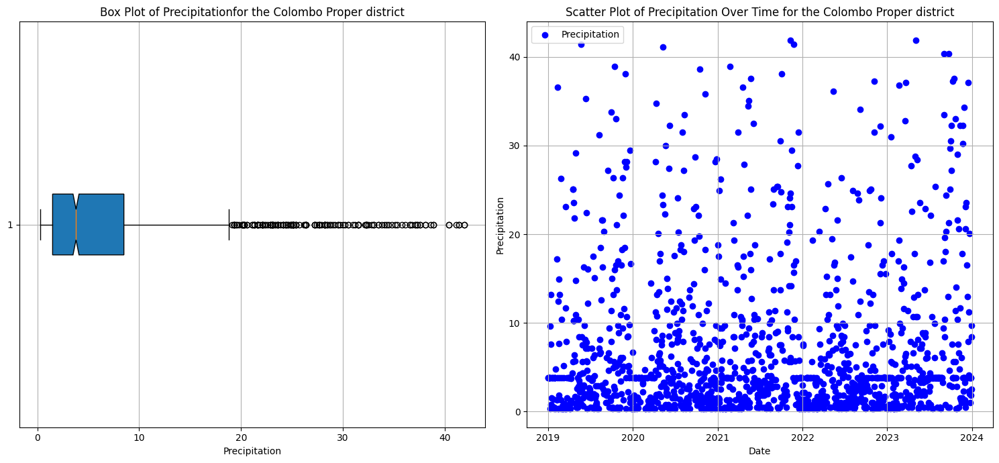

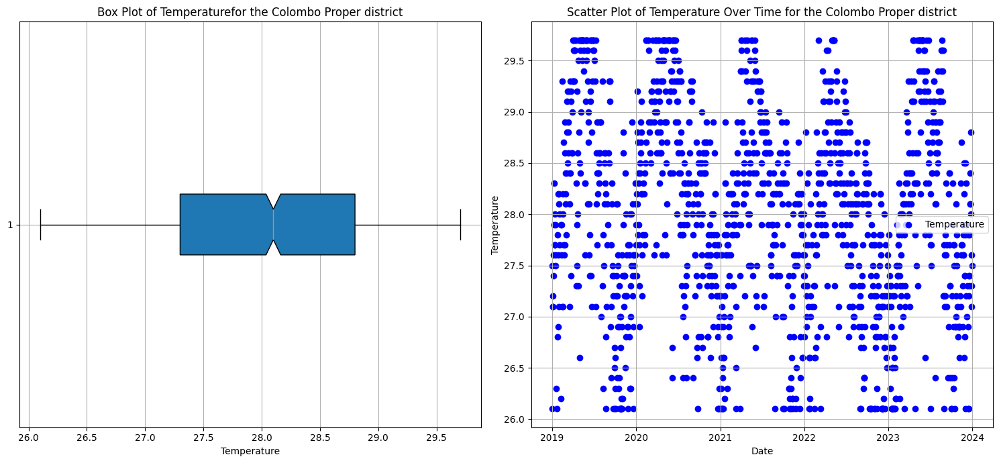

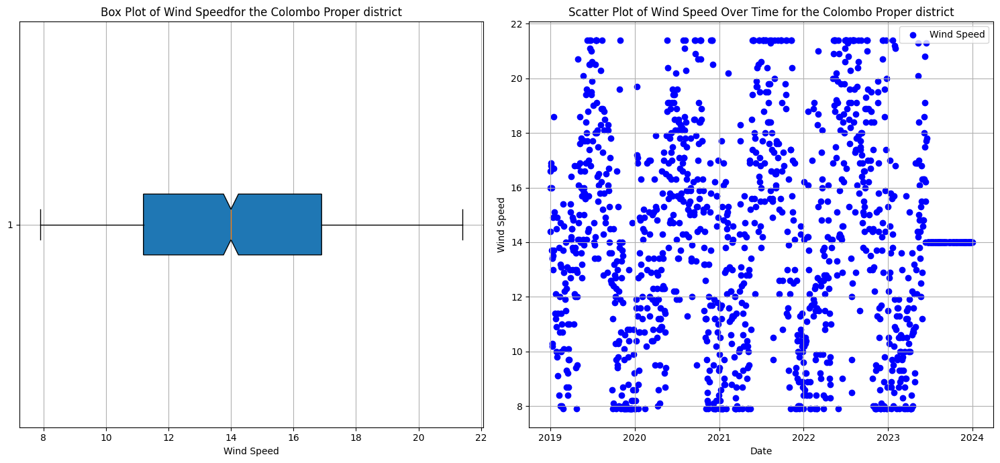

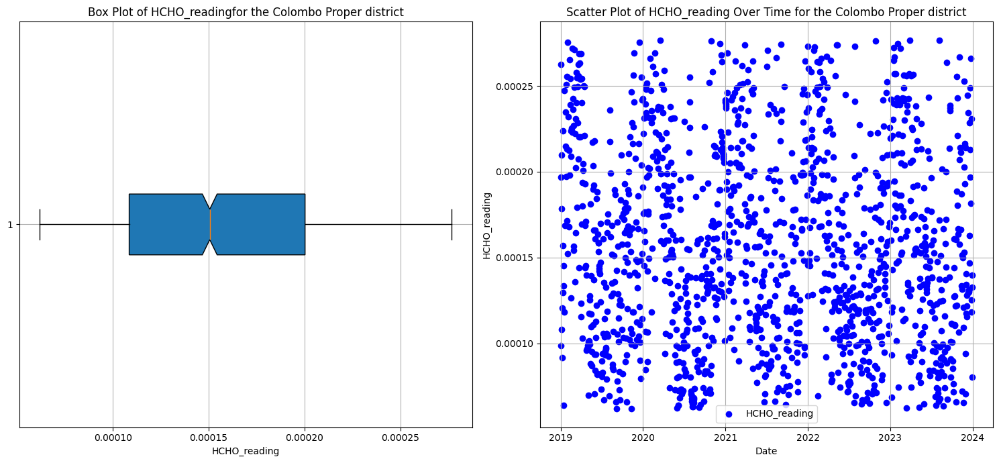

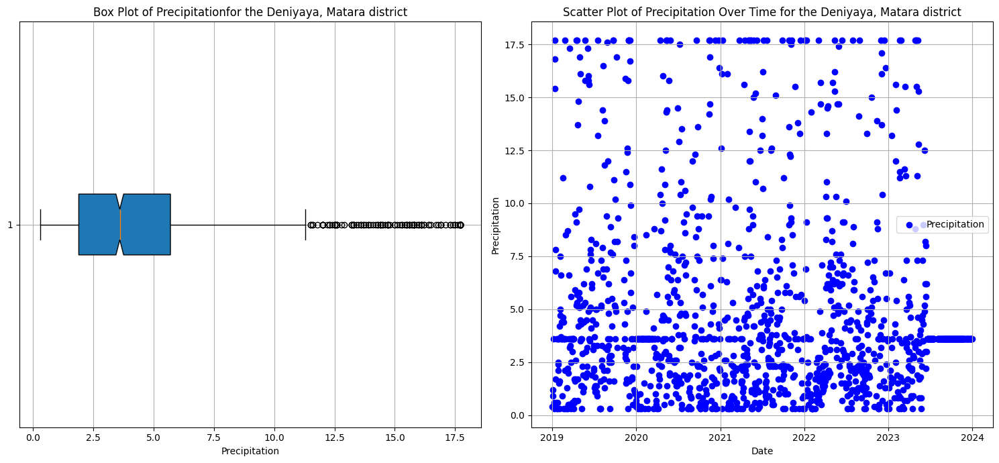

...

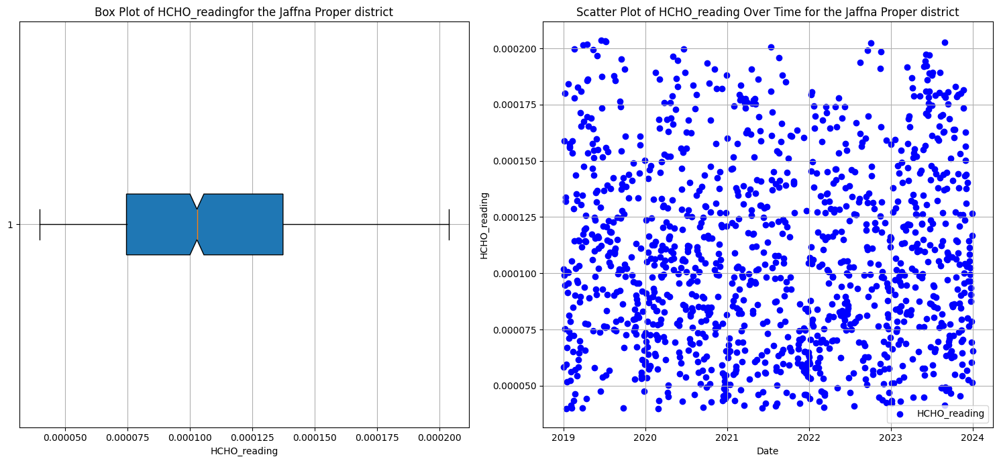

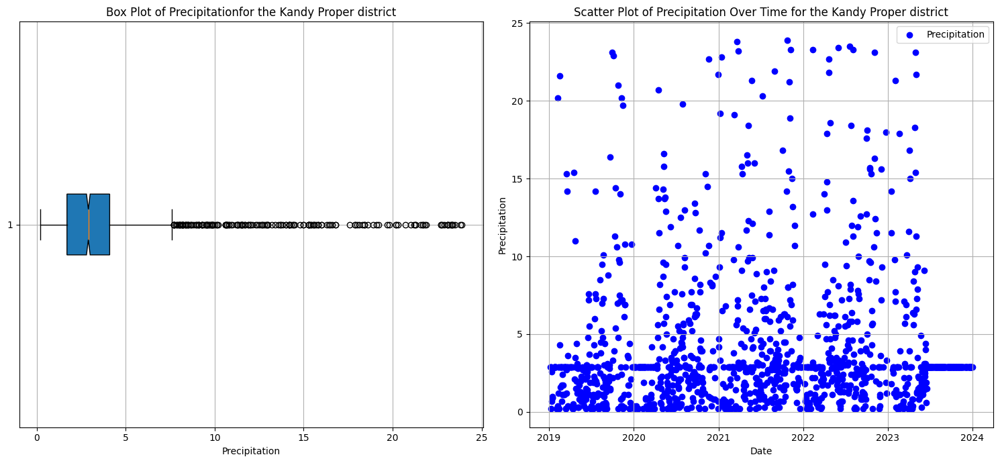

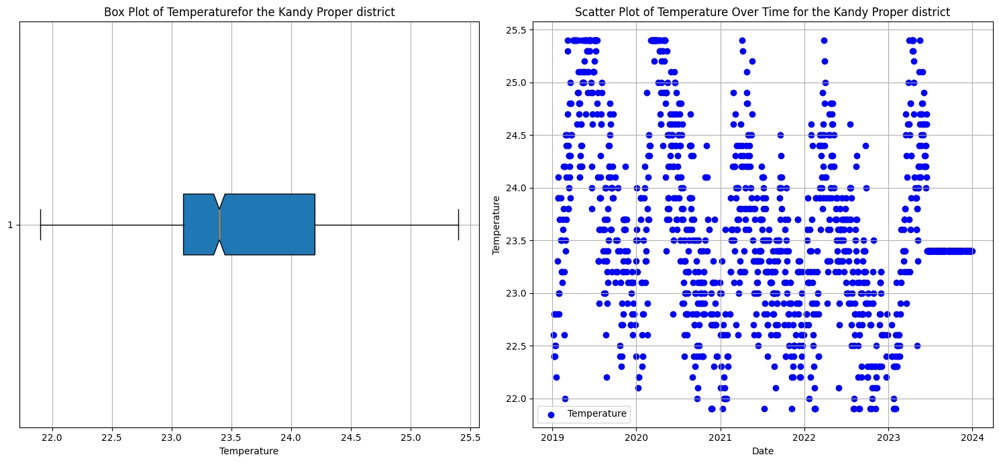

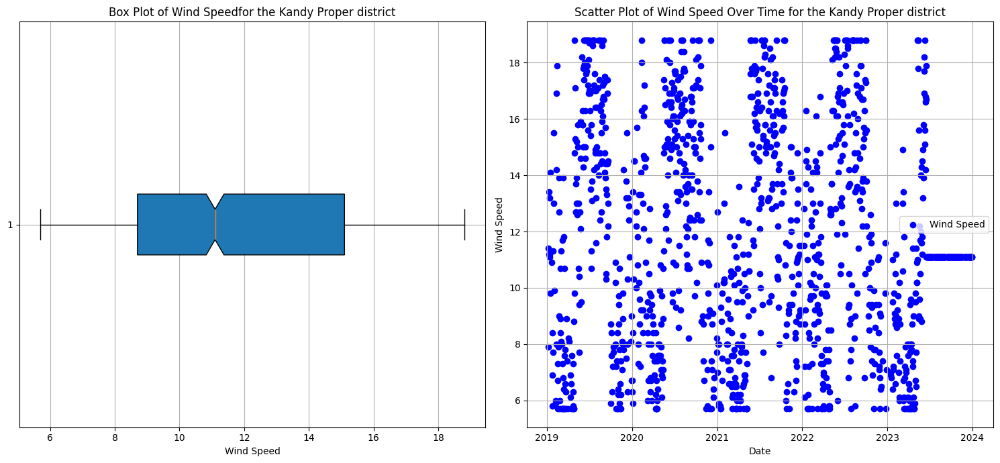

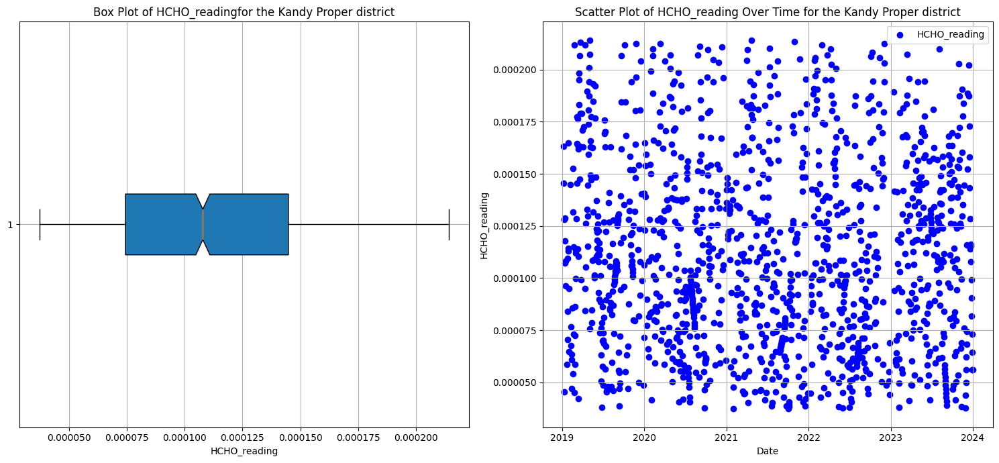

In [154]:
# Iterate through each dataframe in your list
for dataframe in df_list:
    # Iterate through each column in the dataframe
    for column in dataframe.columns:
        # Check if the column is of type float64 and not named 'Elevation'
        if dataframe[column].dtype == 'float64' and column != 'Elevation':
            plt.figure(figsize=(15, 7))

            # Box plot
            plt.subplot(121) 
            plt.boxplot(dataframe[column].dropna(), vert=False, patch_artist=True, showfliers=True, notch=True)
            title = "Box Plot of " + column + "for the " + dataframe.iloc[0, 1] + " district"
            plt.title(title)
            plt.xlabel(column)
            plt.grid(True)

            # Scatter plot
            plt.subplot(122)
            plt.scatter(dataframe["Date"], dataframe[column], color="blue", label=column)
            title = "Scatter Plot of " + column + " Over Time for the " + dataframe.iloc[0, 1] + " district"
            plt.title(title)
            plt.xlabel("Date")
            plt.ylabel(column)
            plt.legend()
            plt.grid(True)

            plt.tight_layout()
            plt.show()

/var/folders/75/ldx_7wz513j2mkg13n8tp0800000gn/T/ipykernel_80001/1989567126.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_monthly_mean = df_numeric.groupby(pd.Grouper(key='Date', freq='M')).mean()


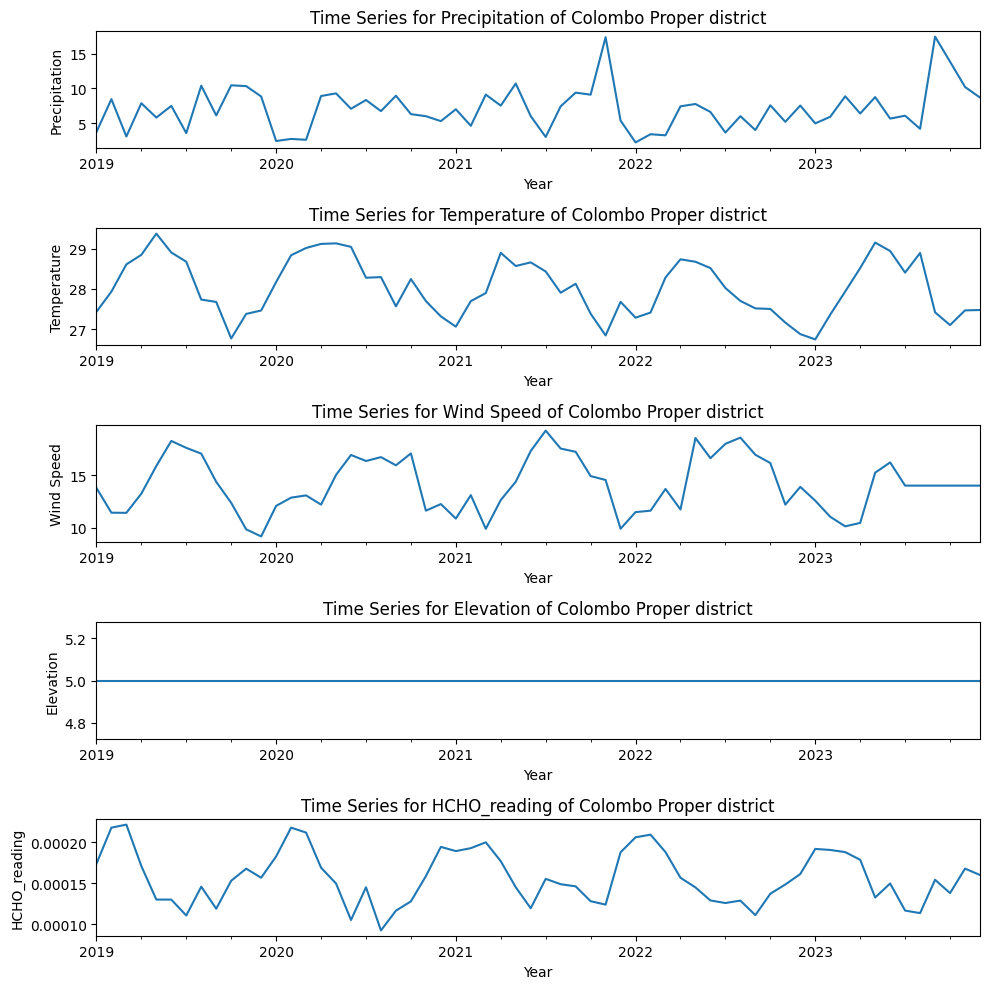

/var/folders/75/ldx_7wz513j2mkg13n8tp0800000gn/T/ipykernel_80001/1989567126.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_monthly_mean = df_numeric.groupby(pd.Grouper(key='Date', freq='M')).mean()


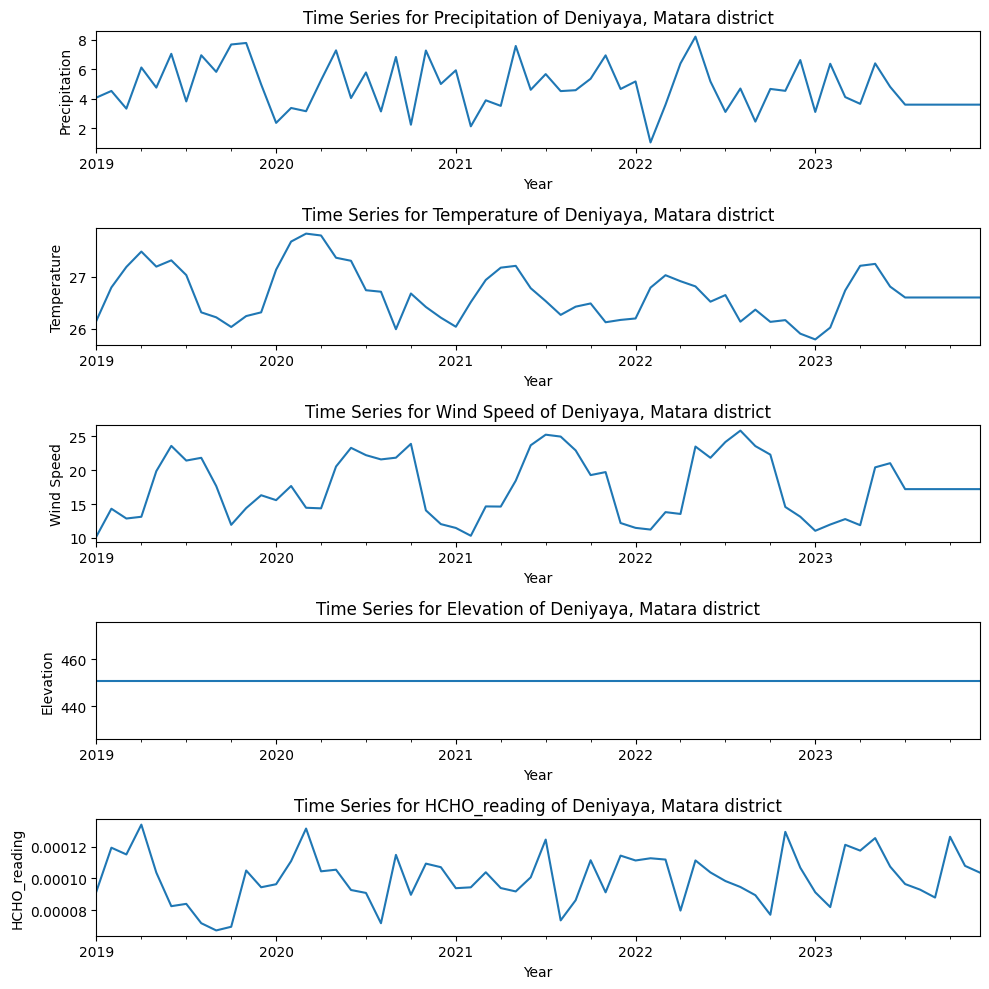

/var/folders/75/ldx_7wz513j2mkg13n8tp0800000gn/T/ipykernel_80001/1989567126.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_monthly_mean = df_numeric.groupby(pd.Grouper(key='Date', freq='M')).mean()


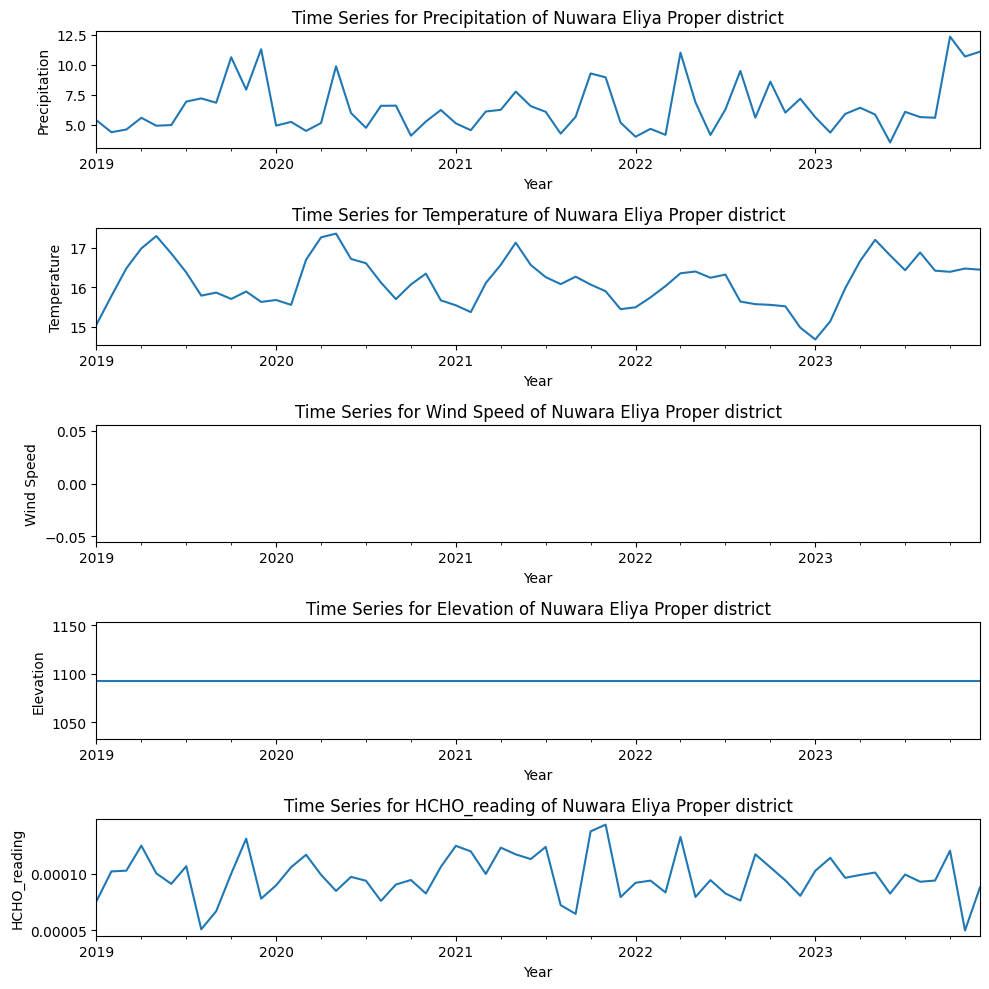

/var/folders/75/ldx_7wz513j2mkg13n8tp0800000gn/T/ipykernel_80001/1989567126.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_monthly_mean = df_numeric.groupby(pd.Grouper(key='Date', freq='M')).mean()


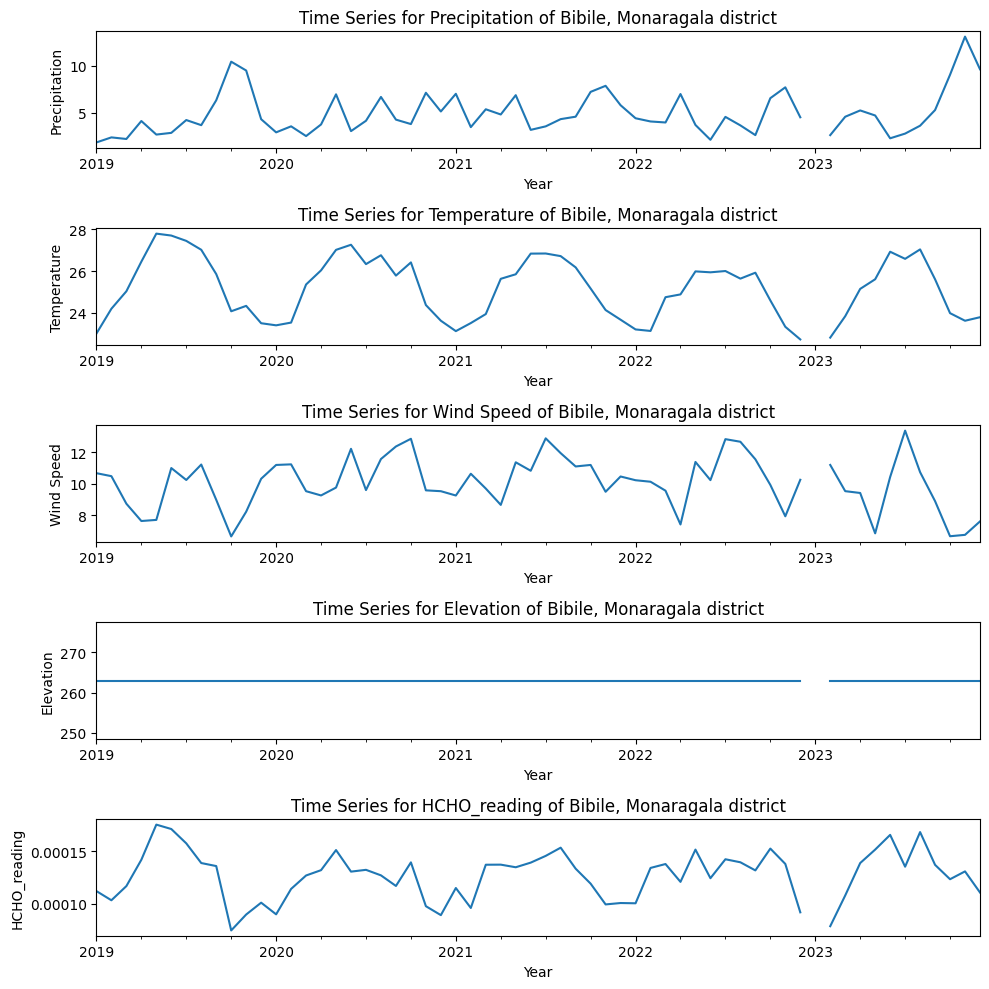

/var/folders/75/ldx_7wz513j2mkg13n8tp0800000gn/T/ipykernel_80001/1989567126.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_monthly_mean = df_numeric.groupby(pd.Grouper(key='Date', freq='M')).mean()


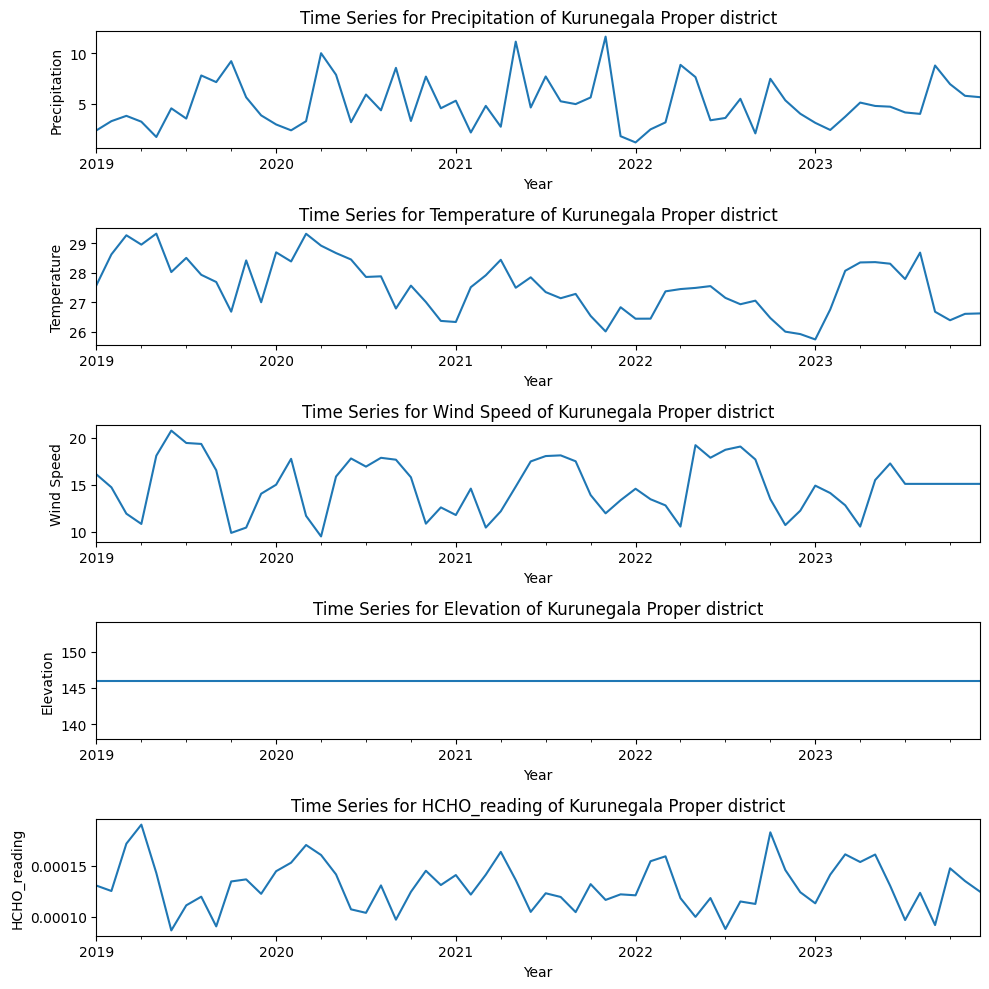

/var/folders/75/ldx_7wz513j2mkg13n8tp0800000gn/T/ipykernel_80001/1989567126.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_monthly_mean = df_numeric.groupby(pd.Grouper(key='Date', freq='M')).mean()


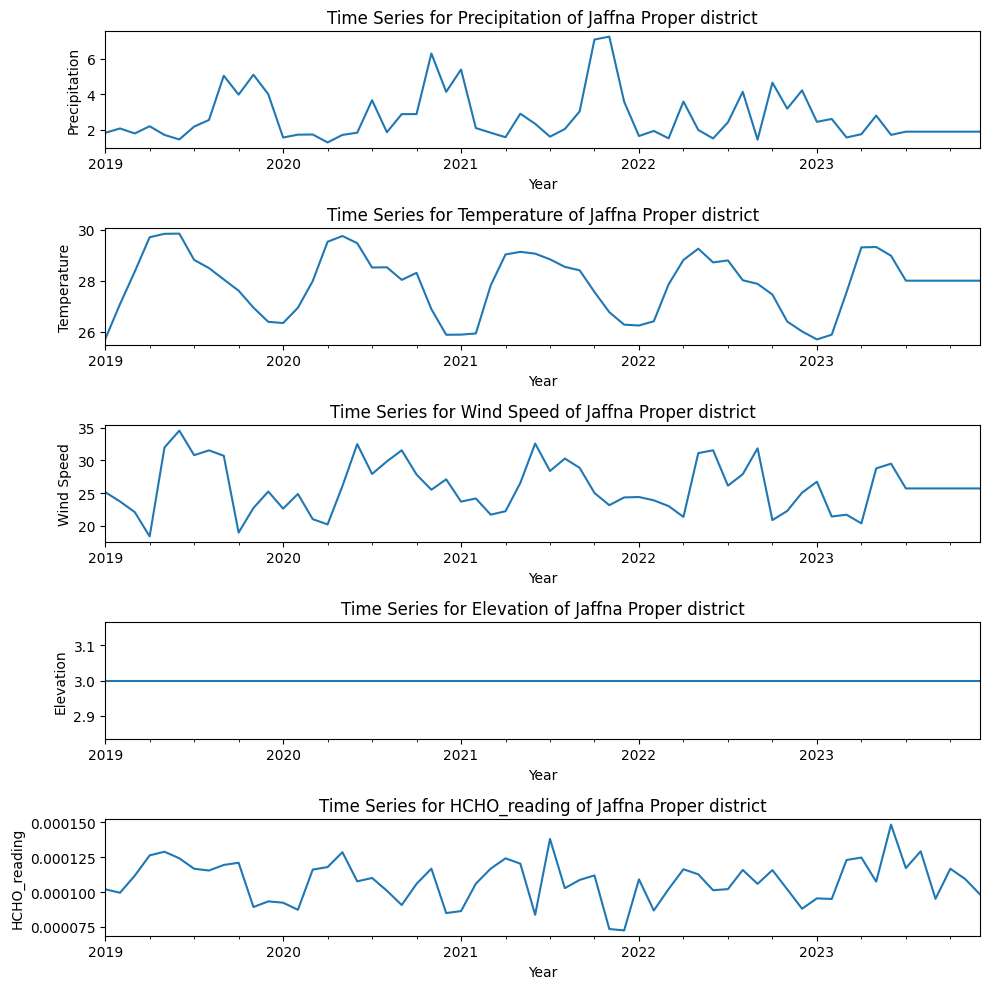

/var/folders/75/ldx_7wz513j2mkg13n8tp0800000gn/T/ipykernel_80001/1989567126.py:8: FutureWarning: 'M' is deprecated and will be removed in a future version, please use 'ME' instead.
  df_monthly_mean = df_numeric.groupby(pd.Grouper(key='Date', freq='M')).mean()


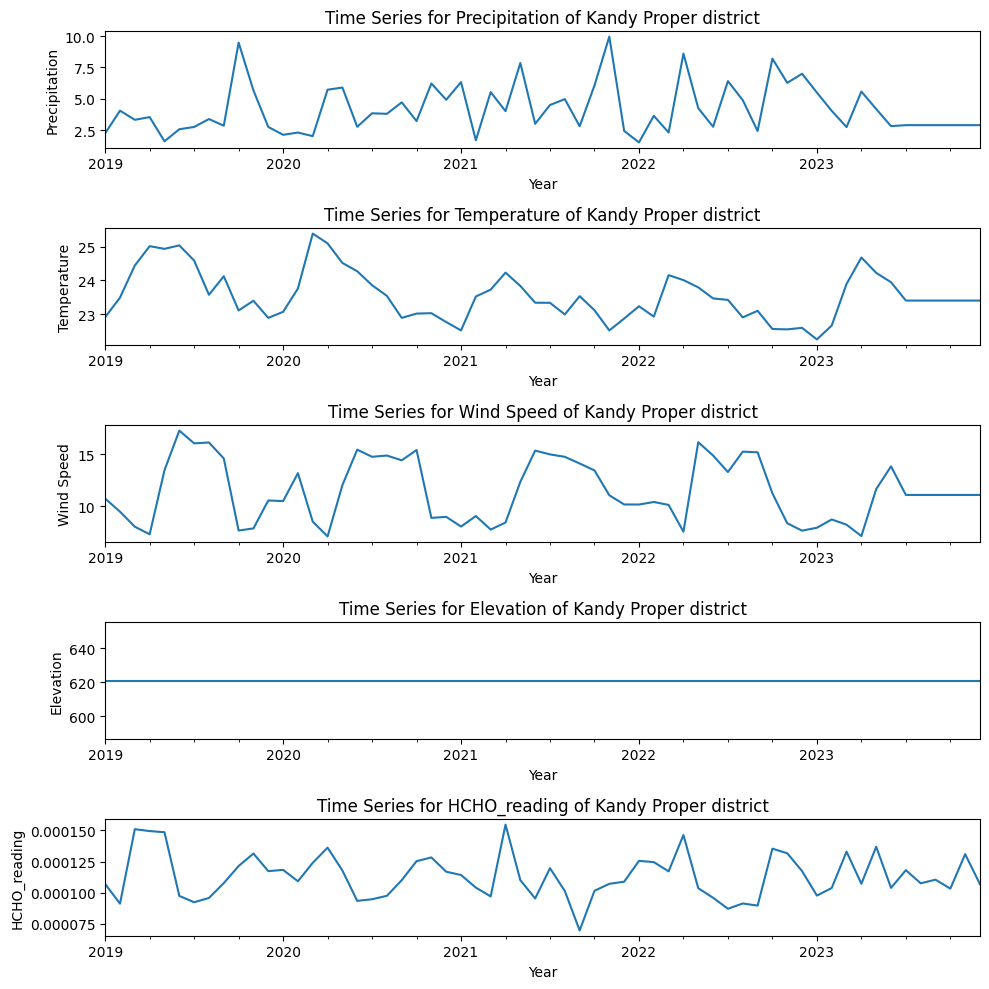

In [155]:
import matplotlib.pyplot as plt

# Create a new figure for each DataFrame
for i, df in enumerate(df_list):
    df_numeric = df.drop(columns=['Location'])

    # Create a new DataFrame with the monthly mean of each time series data
    df_monthly_mean = df_numeric.groupby(pd.Grouper(key='Date', freq='M')).mean()

    # Filter the columns to only include those with data type float64
    float64_cols = df_monthly_mean.select_dtypes(include=['float64']).columns

    # Create subplots of line graphs with the monthly means of each time series data
    fig, axs = plt.subplots(nrows=len(float64_cols), figsize=(10, 10))
    for j, col in enumerate(float64_cols):
        df_monthly_mean[col].plot(kind='line', ax=axs[j])
        axs[j].set_title("Time Series for " + col + " of " + df.iloc[0, 1] + " district")
        axs[j].set_xlabel('Year')
        axs[j].set_ylabel(df_monthly_mean[col].name)
    plt.tight_layout()
    plt.show()

In [156]:
for dataframe in df_list:
    print(BLUE , "DESCRIPTIVE STATISTICS FOR THE" , dataframe.iloc[0, 1], "DISTRICT", RESET)
    print(dataframe.describe())

 DESCRIPTIVE STATISTICS FOR THE Colombo Proper DISTRICT 
                                Date  Precipitation  Temperature   Wind Speed  \
count                           1401    1401.000000  1401.000000  1401.000000   
mean   2021-07-06 23:54:51.648822272       6.982655    28.030978    14.107209   
min              2019-01-01 00:00:00       0.300000    26.100000     7.900000   
25%              2020-04-17 00:00:00       1.500000    27.300000    11.200000   
50%              2021-06-27 00:00:00       3.800000    28.100000    14.000000   
75%              2022-10-13 00:00:00       8.500000    28.800000    16.900000   
max              2023-12-31 00:00:00      41.900000    29.700000    21.400000   
std                              NaN       8.487783     0.999791     3.798742   

       Elevation  HCHO_reading  
count     1401.0   1401.000000  
mean         5.0      0.000156  
min          5.0      0.000062  
25%          5.0      0.000109  
50%          5.0      0.000151  
75%          5.

In [158]:
# Exporting the preprocessed combined database
export_combined_df = pd.concat(df_list, ignore_index=True)
export_combined_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 9604 entries, 0 to 9603
Data columns (total 7 columns):
 #   Column         Non-Null Count  Dtype         
---  ------         --------------  -----         
 0   Date           9604 non-null   datetime64[ns]
 1   Location       9604 non-null   object        
 2   Precipitation  9604 non-null   float64       
 3   Temperature    9604 non-null   float64       
 4   Wind Speed     8128 non-null   float64       
 5   Elevation      9604 non-null   float64       
 6   HCHO_reading   9604 non-null   float64       
dtypes: datetime64[ns](1), float64(5), object(1)
memory usage: 525.3+ KB


In [159]:
export_combined_df.to_csv("Datasets/task_02_export.csv", index=False)